Section for importing dataset

In [ ]:
import zipfile

# Not augmented Dataset
#with zipfile.ZipFile("/content/drive/MyDrive/TestTask/TestTask-2.zip", 'r') as file:
#    file.extractall("/content/data")

# Augmented Dataset
with zipfile.ZipFile("/content/drive/MyDrive/TestTask/TestTask.zip", 'r') as file:
    file.extractall("/content/data")

# Important imports

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from torch.utils import data
from pycocotools.coco import COCO
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence

# Implementing all important classes

## Implementing Dataset

In [ ]:
class PetDataset(data.Dataset):
    def __init__(self, root, annotation, transforms=None):
        self.root = root
        self.transforms = transforms
        self.coco = COCO(annotation)
        self.ids = list(sorted(self.coco.imgs.keys()))

    def __getitem__(self, index):
        # Extracting image_id from the dataset
        coco = self.coco
        img_id = self.ids[index]

        # Extracting all the annotations connected to that image_id
        ann_ids = coco.getAnnIds(imgIds=img_id)
        coco_annotation = coco.loadAnns(ann_ids)

        # Getting the file name of the image
        path = coco.loadImgs(img_id)[0]['file_name']

        # Loading image to the Memory
        img = Image.open(os.path.join(self.root, path))

        num_objs = len(coco_annotation)

        boxes = []
        labels = []
        iscrowd = []
        area = 0
        for i in range(num_objs):
            xmin = coco_annotation[i]['bbox'][0]
            ymin = coco_annotation[i]['bbox'][1]
            xmax = xmin + coco_annotation[i]['bbox'][2]
            ymax = ymin + coco_annotation[i]['bbox'][3]
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(coco_annotation[i]['category_id'])
            iscrowd.append(coco_annotation[i]['iscrowd'])
            area += (xmax-xmin)*(ymax-ymin)

        area = torch.as_tensor(area, dtype=torch.float32)

        if num_objs == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)

        img_id = torch.tensor([img_id])
        labels = torch.tensor(labels, dtype=torch.long)
        iscrowd = torch.tensor(iscrowd, dtype=torch.long)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = img_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.ids)

## Implementing Useful Functions

### Functions connected with Data processing

In [ ]:
def get_transform():
    custom_transforms = []
    custom_transforms.append(torchvision.transforms.ToTensor())
    return torchvision.transforms.Compose(custom_transforms)


def collate_fn(batch):
    return tuple(zip(*batch))


def getDataLoader(images_path, annotations_path, batch_size=16, shuffle=True):
    dataset = PetDataset(
                        root=images_path,
                        annotation=annotations_path,
                        transforms=get_transform()
                        )

    data_loader = torch.utils.data.DataLoader(dataset,
                                              batch_size=batch_size,
                                              shuffle=shuffle,
                                              num_workers=2,
                                              collate_fn=collate_fn)

    return data_loader

### Functions connected with Model instantiation

In [ ]:
def get_model(num_classes):
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(weights="COCO_V1")
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    model.to(device)

    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.8, weight_decay=0.005)

    return model, optimizer

### Functions connected with training

In [ ]:
def train_epoch(model, optimizer, data_loader):
    model.train()
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    for imgs, annotations in data_loader:
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]

        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    print(f'Loss on this epoch: {losses}')


def train_model(model, optimizer, epochs, data_loader, valid_loader, test_loader):
    print("Start training the model...")
    for epoch in range(epochs):
        print(f"Epoch: {epoch + 1}")
        train_epoch(model, optimizer, data_loader)
        mean_precision_cats, mean_recall_cats, mean_precision_dogs, mean_recall_dogs = validate_epoch(model, valid_loader)
        print(f"Cat Precision: {mean_precision_cats}, Cat Recall: {mean_recall_cats}, Dog Precision: {mean_precision_dogs}, Dog Recall: {mean_recall_dogs}")

    print(test_model(model, test_loader))
    print("Model has been trained, saving weights...")
    torch.save(model, f"/content/model_{epoch+1}.pt")
    model.eval()

### Functions connected with validating

Defining "constants"

In [ ]:
VISUALIZING_THRESHOLD = 0.8

In [ ]:
def IoU(box_actual, box_target):
    xmin_1, ymin_1, xmax_1, ymax_1 = box_actual
    xmin_2, ymin_2, xmax_2, ymax_2 = box_target

    area_actual = (xmax_1 - xmin_1) * (ymax_1 - ymin_1)
    area_target = (xmax_2 - xmin_2) * (ymax_2 - ymin_2)

    xmin = max(xmin_1, xmin_2)
    ymin = max(ymin_1, ymin_2)
    xmax = min(xmax_1, xmax_2)
    ymax = min(ymax_1, ymax_2)

    if xmax <= xmin or ymax <= ymin:
        return 0.0

    area_intersection = (xmax - xmin) * (ymax - ymin)

    return area_intersection / (area_actual + area_target - area_intersection)


def compute_metrix(predictions, actual): # Let's assume that in predictions already boxes with score > 90%
    true_labels = actual["labels"]
    true_boxes = actual["boxes"]

    predicted_labels = predictions["labels"]
    predicted_boxes = predictions["boxes"]

    cat_dict = {"TP":0, "FP":0, "FN":0}
    dog_dict = {"TP":0, "FP":0, "FN":0}
    """
        To calculate True Positive,
        1) Відсортовуємо по скору найвірогідніші бокси
        2) Обчислюємо IoU матрицю
        3) Обчислюємо TF, NF, NP:
            Поки для actual_box_i found == false і поки є такі IoU, що більші за 0.5:
                1. Знаходимо найбільшу IoU (IoU повинна також бути більша за 0.5) для actual_box_i
                2. Якщо лейбли співпадають, то label_predicted_box_i_TP += 1, found = true
                3. Якщо лейбли не співпадають, то label_predicted_box_i_FP += 1 && label_actual_box_i_FN += 1
            Усі IoU, що залишились і є більшими за 0.5 в стовпчику actual_box_i:
                1. Якщо лейбли співпадають, то label_predicted_box_j_FP += 1 (бо не найвищий IoU)
                2. Якщо лейбли не співпадають, то label_predicted_box_j_FP += 1

    """

    # Calculating matrix
    IoU_matrix = []
    for predicted_box in predicted_boxes:
        row = []
        for actual_box in true_boxes:
            row.append(IoU(predicted_box, actual_box))
        IoU_matrix.append(row)

    #print(*IoU_matrix, sep="\n")

    # Computing TP, FP, FN
    for index in range(len(true_labels)):
        found = False
        used_indexes = []
        while found == False:
            max_IoU = 0
            max_index = 0
            for row in range(len(IoU_matrix)):
                if max_IoU < IoU_matrix[row][index] and not (max_index in used_indexes):
                    max_index = row
                    max_IoU = IoU_matrix[row][index]

            if max_IoU >= 0.5:
                if true_labels[index] == predicted_labels[max_index]:
                    if true_labels[index] == 1:
                        cat_dict["TP"] += 1
                    else:
                        dog_dict["TP"] += 1
                    found = True
                else:
                    if predicted_labels[index] == 1:
                        cat_dict["FP"] += 1
                        dog_dict["FN"] += 1
                    else:
                        cat_dict["FN"] += 1
                        dog_dict["FP"] += 1
                used_indexes.append(max_index)
            else:
                found = True

        for row in range(len(IoU_matrix)):
            if IoU_matrix[row][index] >= 0.5 and not (row in used_indexes):
                used_indexes.append(row)
                if predicted_labels[row] == 1 and true_labels[index] == 2:
                    cat_dict["FP"] += 1
                    dog_dict["FN"] += 1
                elif predicted_labels[row] == 1 and true_labels[index] == 1:
                    cat_dict["FP"] += 1
                elif predicted_labels[row] == 2 and true_labels[index] == 1:
                    cat_dict["FN"] += 1
                    dog_dict["FP"] += 1
                elif predicted_labels[row] == 2 and true_labels[index] == 2:
                    dog_dict["FP"] += 1

    return cat_dict, dog_dict


def calculate_precision(metrics_dict):
    TP = metrics_dict["TP"]
    FP = metrics_dict["FP"]

    if (TP + FP) != 0:
        return TP / (TP + FP)
    return None


def calculate_recall(metrics_dict):
    TP = metrics_dict["TP"]
    FN = metrics_dict["FN"]
    if (FN + TP) != 0:
        return TP / (FN + TP)
    return None


@torch.no_grad()
def validate_epoch(model, dataloader, uni=1000):
    model.eval()

    total = 0
    sum_loss = 0
    correct = 0

    precision_cats = []
    recall_cats = []
    precision_dogs = []
    recall_dogs = []

    for images, annotations in dataloader:
        for image, annotation in zip(images, annotations):
            predictions = model(torch.stack([image]).cuda().float())[0]
            pred_dict = {"boxes": [], "labels": []}
            for index, score in enumerate(predictions["scores"]):
                if score >= 0.9:
                    pred_dict["boxes"].append(predictions["boxes"][index])
                    pred_dict["labels"].append(predictions["labels"][index])

            cat_dict, dog_dict = compute_metrix(pred_dict, annotation)

            if calculate_precision(cat_dict) != None:
                precision_cats.append(calculate_precision(cat_dict))
            if calculate_recall(cat_dict) != None:
                recall_cats.append(calculate_recall(cat_dict))
            if calculate_precision(dog_dict) != None:
                precision_dogs.append(calculate_precision(dog_dict))
            if calculate_recall(dog_dict) != None:
                recall_dogs.append(calculate_recall(dog_dict))

    mean_precision_cats = sum(precision_cats) / len(precision_cats)
    mean_recall_cats = sum(recall_cats) / len(recall_cats)
    mean_precision_dogs = sum(precision_dogs) / len(precision_dogs)
    mean_recall_dogs = sum(recall_dogs) / len(recall_dogs)

    return mean_precision_cats, mean_recall_cats, mean_precision_dogs, mean_recall_dogs

### Functions Connected with Testing Model

In [ ]:
@torch.no_grad()
def test_model(model, test_loader):
    mean_precision_cats, mean_recall_cats, mean_precision_dogs, mean_recall_dogs = validate_epoch(model, test_loader)
    mean_precision = (mean_precision_cats + mean_precision_dogs) / 2
    mean_recall = (mean_recall_cats + mean_recall_dogs) / 2

    macro_average_f1 = 2 * mean_recall * mean_precision / (mean_recall + mean_precision)
    f1_cats = 2 * mean_precision_cats * mean_recall_cats / (mean_precision_cats + mean_recall_cats)
    f1_dogs = 2 * mean_precision_dogs * mean_recall_dogs / (mean_precision_dogs + mean_recall_dogs)

    results_dict = {}
    results_dict["Cats"] = {
        "f1" : f1_cats,
        "precision" : mean_precision_cats,
        "recall" : mean_recall_cats
    }

    results_dict["Dogs"] = {
        "f1" : f1_dogs,
        "precision" : mean_precision_dogs,
        "recall" : mean_recall_dogs
    }

    return results_dict

testing

In [ ]:
base = "/content/data/TestTask"

train_path = base + "/train"
train_annotations_json = base + "/train/_annotations.coco.json"
validation_path = base + "/valid"
validation_annnotations_json = base + "/valid/_annotations.coco.json"
test_path = base + "/test"
testing_annnotations_json = base + "/test/_annotations.coco.json"

valid_loader = getDataLoader(validation_path, validation_annnotations_json, shuffle=False)
model = torch.load("/content/drive/MyDrive/TestTask/v2_model_dogs_4.pt", map_location=torch.device('cuda'))

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
validate_epoch(model, valid_loader)

(0.9905660377358491, 1.0, 0.9795918367346939, 1.0)

### Functions connected with evaluating results

In [ ]:
@torch.no_grad()
def evaluate(image, model):
    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

    model.eval()
    image = Image.open(image)
    transform = transforms.Compose([transforms.ToTensor(), transforms.Resize((640, 640))])

    image_transformed = transform(image).float()
    image_transformed = image_transformed.unsqueeze_(0)
    image_transformed = image_transformed.to(device)

    prediction = model(image_transformed)

    return prediction


def visualize(image, predictions):
    print(predictions)
    image = Image.open(image)
    image = image.resize((640, 640))

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)

    box_list = [
        {
            "box": box,
            "class": predictions[0]["labels"][index],
            "score": predictions[0]["scores"][index]
        } for index, box in enumerate(predictions[0]["boxes"])
                if predictions[0]["scores"][index] > VISUALIZING_THRESHOLD
        ]

    for entry in box_list:
        box = entry["box"]
        label = entry["class"]
        score = entry["score"]

        box = box.cpu().detach().numpy()

        color = 'r' if label == 1 else 'b'
        name = 'cat' if label == 1 else 'dog'

        rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                 linewidth=2,
                                 edgecolor=color,
                                 facecolor='none',
                                 )
        ax.text(box[0] + 2, box[1] + 12, f"{name}: {score}",
                                 fontweight=500,
                                 fontsize=13)
        ax.add_patch(rect)

    plt.show()


def predict(image, model):
    predictions = evaluate(image, model)
    visualize(image, predictions)

# Training Model

Defining constants

In [ ]:
base = "/content/data/TestTask"

train_path = base + "/train"
train_annotations_json = base + "/train/_annotations.coco.json"
validation_path = base + "/valid"
validation_annnotations_json = base + "/valid/_annotations.coco.json"
test_path = base + "/test"
testing_annnotations_json = base + "/test/_annotations.coco.json"

model, optimizer = get_model(num_classes=3)
#model = torch.load("/content/drive/MyDrive/TestTask/model_10.pt", map_location=torch.device('cpu'))

Loading datasets

In [ ]:
train_loader = getDataLoader(train_path, train_annotations_json, batch_size=4)
valid_loader = getDataLoader(validation_path, validation_annnotations_json, shuffle=False)
test_loader = getDataLoader(test_path, testing_annnotations_json, shuffle=False)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


Training

In [ ]:
train_model(model, optimizer, 6, data_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

Start training the model...
Epoch: 1
Loss on this epoch: 0.045127637684345245
Cat Precision: 1.0, Cat Recall: 1.0, Dog Precision: 1.0, Dog Recall: 1.0
Epoch: 2
Loss on this epoch: 0.06743359565734863
Cat Precision: 1.0, Cat Recall: 1.0, Dog Precision: 1.0, Dog Recall: 1.0
Epoch: 3
Loss on this epoch: 0.058689866214990616
Cat Precision: 1.0, Cat Recall: 0.9565217391304348, Dog Precision: 0.9574468085106383, Dog Recall: 1.0
Epoch: 4
Loss on this epoch: 0.03520004451274872
Cat Precision: 0.9803921568627451, Cat Recall: 0.9803921568627451, Dog Precision: 0.9787234042553191, Dog Recall: 0.9787234042553191
Epoch: 5
Loss on this epoch: 0.023716676980257034
Cat Precision: 1.0, Cat Recall: 0.9795918367346939, Dog Precision: 0.9761904761904762, Dog Recall: 1.0
Epoch: 6
Loss on this epoch: 0.020919129252433777
Cat Precision: 1.0, Cat Recall: 0.9607843137254902, Dog Precision: 0.9545454545454546, Dog Recall: 1.0
{'Cats': {'f1': 0.9803921568627451, 'precision': 1.0, 'recall': 0.9615384615384616}, '

In [ ]:
torch.cuda.empty_cache()

In [29]:
! mv "/content/model_weights.pt" "/content/drive/MyDrive/TestTask"

In [28]:
torch.save(model.state_dict(), "/content/model_weights.pt")

In [ ]:
test_model(model, test_loader)

{'Cats': {'f1': 1.0, 'precision': 1.0, 'recall': 1.0},
 'Dogs': {'f1': 1.0, 'precision': 1.0, 'recall': 1.0}}

In [ ]:
torch.save(model, f"/content/v2_model_dogs_{4}_no_aug.pt")

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


[{'boxes': tensor([[216.0355,  34.2714, 423.9231, 638.8883]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'scores': tensor([0.9952], device='cuda:0')}]


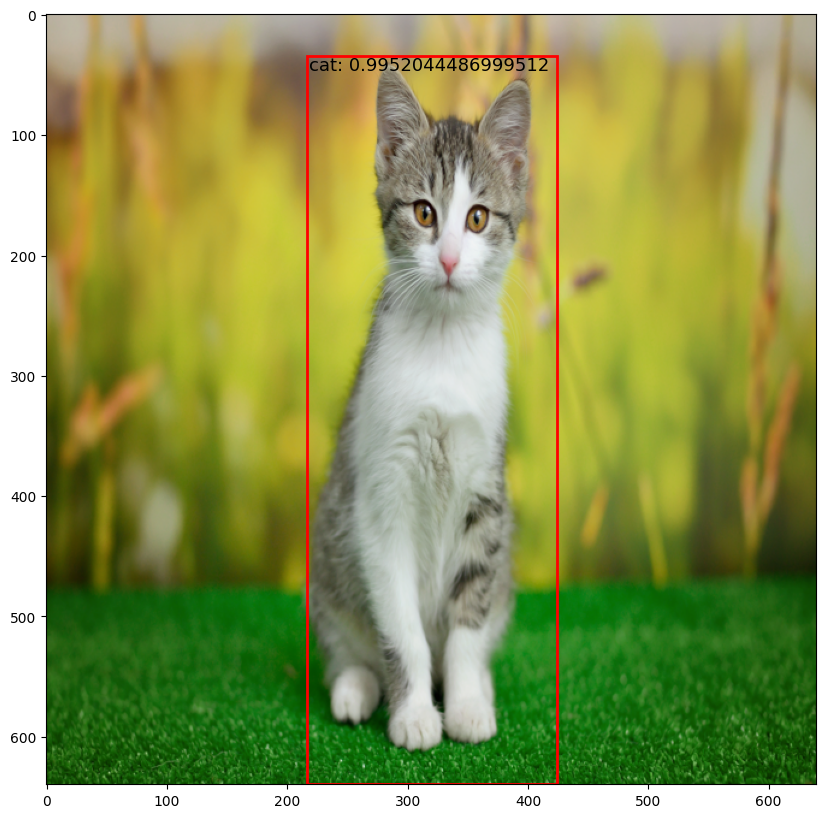

In [ ]:
predict("cat.jpg", model)

[{'boxes': tensor([[123.2906,  46.9683, 601.7290, 625.2460],
        [136.6553, 232.5876, 374.6533, 640.0000]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'scores': tensor([0.9938, 0.4682], device='cuda:0')}]


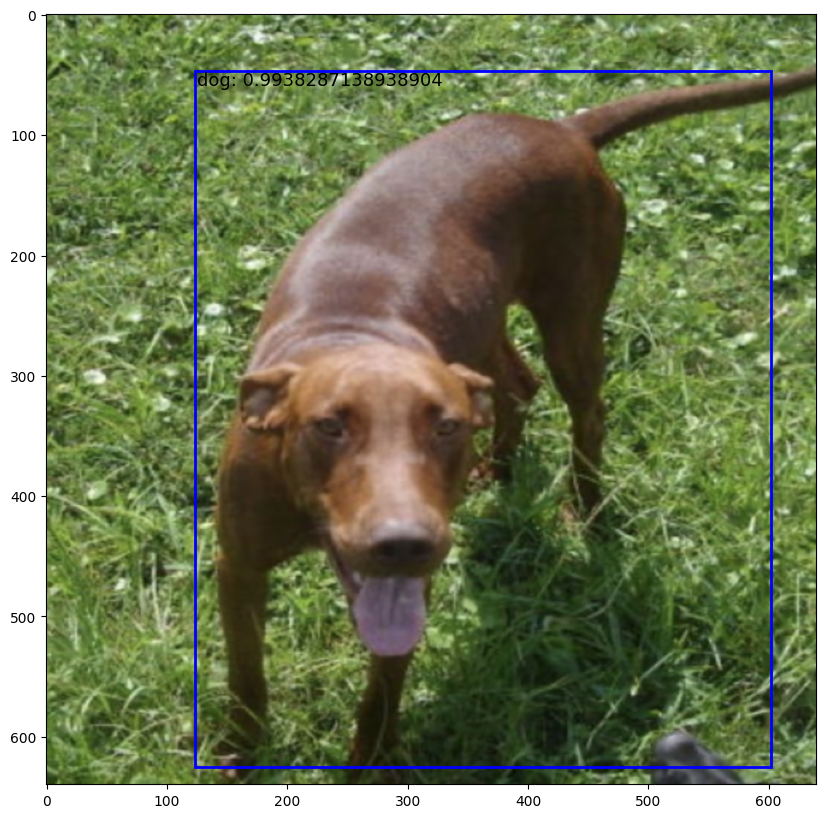

In [ ]:
predict("dog.jpg", model)

[{'boxes': tensor([[251.1566,  19.2956, 565.2920, 633.2772],
        [264.2209,  11.9807, 481.3695, 424.4192]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'scores': tensor([0.9909, 0.1468], device='cuda:0')}]


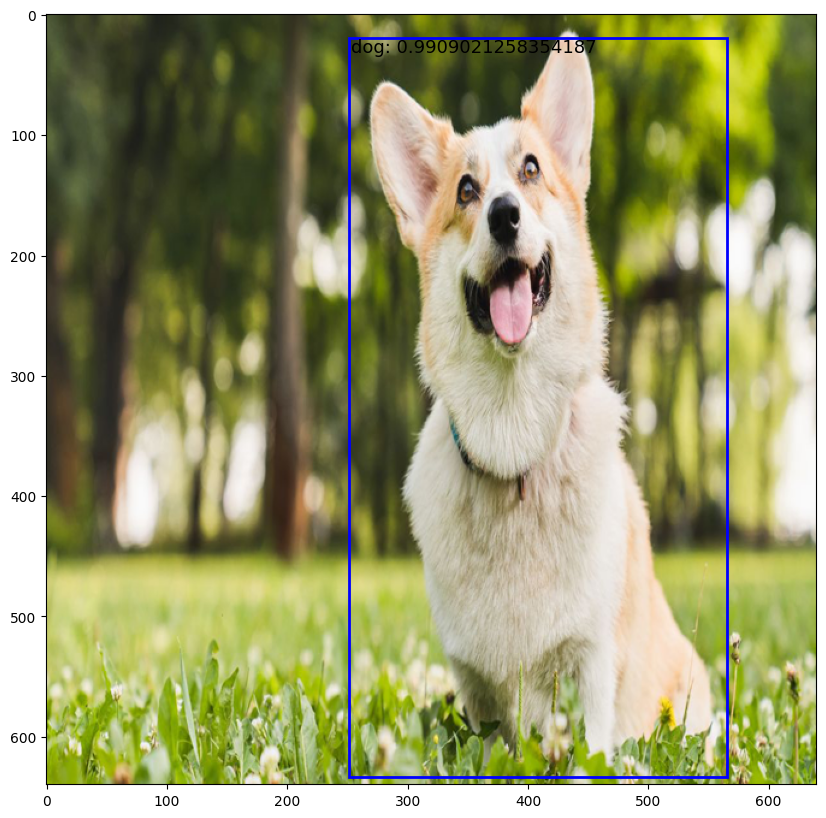

In [ ]:
predict("corgi.jpg", model)

[{'boxes': tensor([[184.6192, 170.6346, 596.1862, 536.6718],
        [288.8308,   9.7007, 456.5444, 298.2897],
        [284.2321,   2.0138, 456.3117, 290.5593]], device='cuda:0'), 'labels': tensor([1, 2, 1], device='cuda:0'), 'scores': tensor([0.9952, 0.5135, 0.2430], device='cuda:0')}]


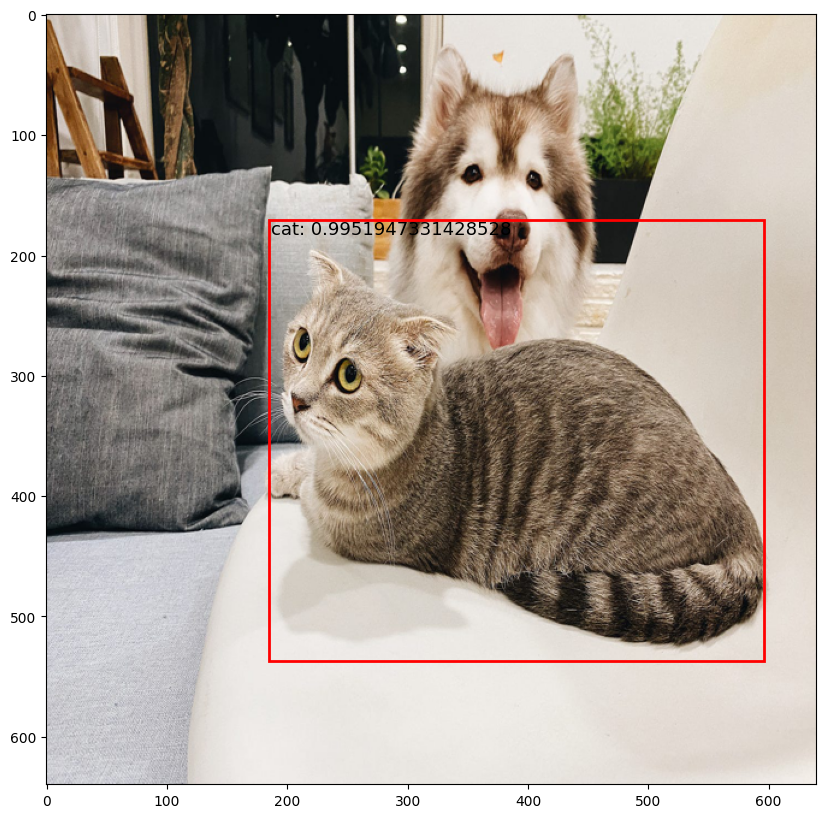

In [ ]:
predict("/content/dog_and_cat.jpg", model)

[{'boxes': tensor([[ 38.6706,  28.2567, 548.8980, 565.1440],
        [ 35.3453,  22.4279, 581.3037, 561.0934]], device='cuda:0'), 'labels': tensor([2, 1], device='cuda:0'), 'scores': tensor([0.9969, 0.4558], device='cuda:0')}]


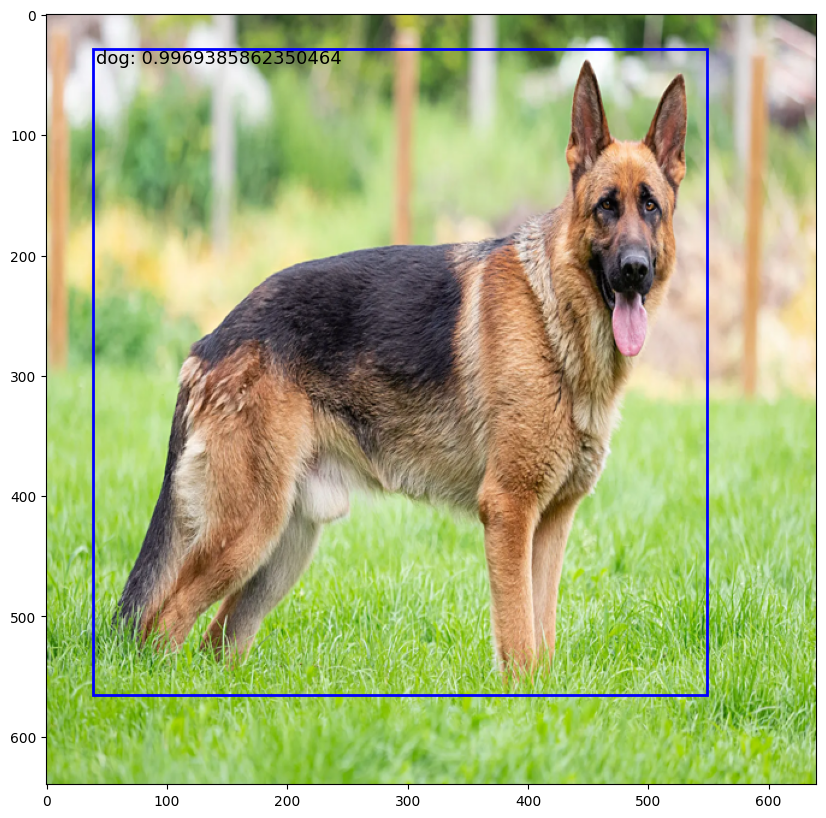

In [26]:
predict("/content/sheperd.jpg", model)

[{'boxes': tensor([[282.1347,  23.4172, 531.7588, 632.4971],
        [280.4763,  46.5943, 541.1577, 640.0000]], device='cuda:0'), 'labels': tensor([2, 1], device='cuda:0'), 'scores': tensor([0.5432, 0.4800], device='cuda:0')}]


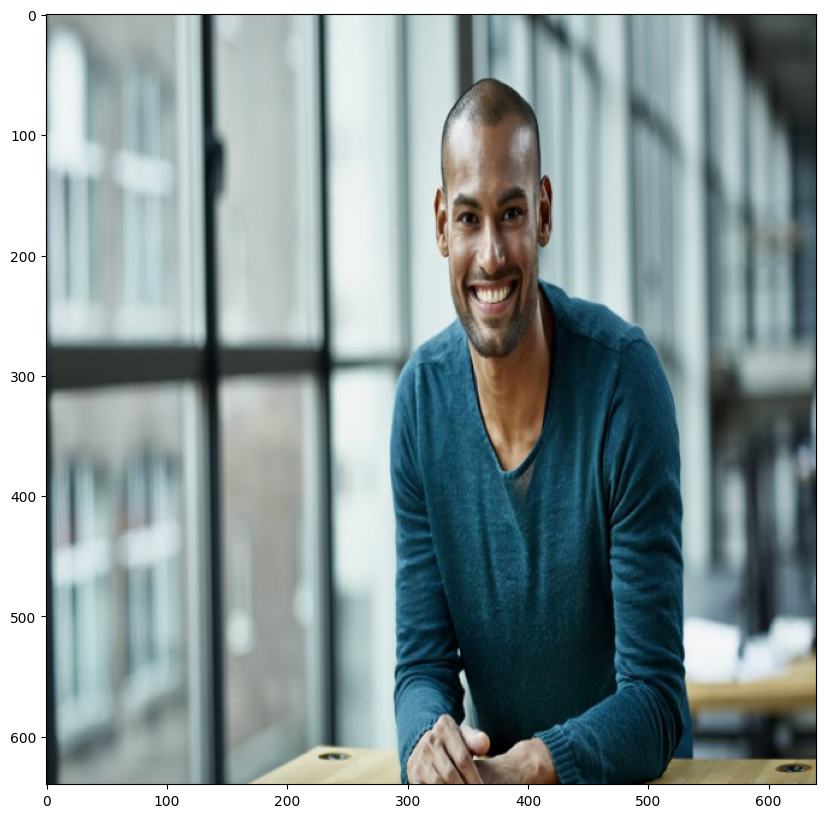

In [ ]:
predict("person.jpg", model)

[{'boxes': tensor([[257.7121,  72.0069, 593.3799, 639.2950],
        [ 41.7859,   5.6628, 314.9146, 640.0000],
        [ 31.6057,   0.0000, 312.0624, 619.7861]], device='cuda:0'), 'labels': tensor([2, 2, 1], device='cuda:0'), 'scores': tensor([0.9959, 0.3766, 0.2027], device='cuda:0')}]


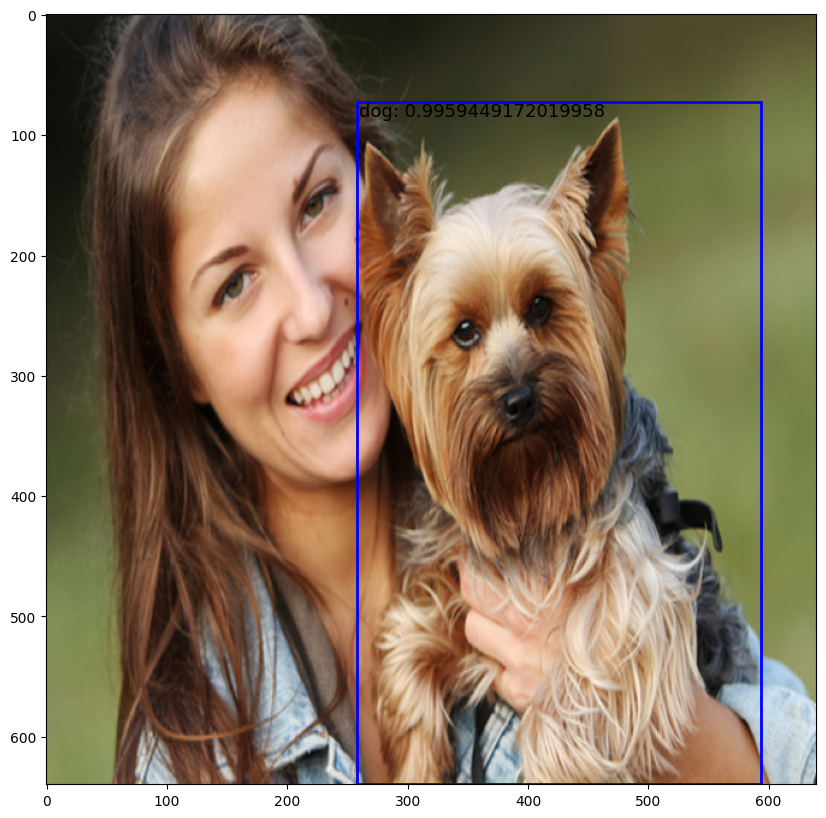

In [ ]:
predict("person_with_dog.jpg", model)

[{'boxes': tensor([[  0.0000, 290.4067,  98.7306, 450.7923],
        [ 38.9548, 194.8053, 114.8997, 379.1358],
        [242.0723, 297.1784, 337.9951, 486.0964],
        [ 42.3261, 449.1040, 115.0839, 583.5389],
        [346.3048, 490.6804, 421.1698, 617.8605],
        [495.0456, 413.9530, 575.7538, 594.7311],
        [274.1604, 454.2974, 353.4721, 600.2072],
        [475.1743, 495.0698, 515.1557, 586.5775],
        [174.4109, 515.8581, 228.0820, 624.0441],
        [229.9330, 180.5484, 286.9178, 318.8099],
        [468.4935, 182.9126, 524.1008, 338.4179],
        [330.3948, 417.8810, 399.2820, 529.2604],
        [280.3542, 202.4651, 359.1730, 416.1993],
        [ 73.9899, 165.3135, 115.1047, 210.1320],
        [348.9323, 343.8021, 421.2289, 498.1228],
        [175.2993, 273.0504, 247.4870, 473.3399],
        [108.6877, 488.3342, 176.9076, 607.8228],
        [415.5951, 523.8544, 467.3137, 632.3914],
        [101.6657, 342.7896, 183.6473, 511.5706],
        [541.5814, 285.8247, 627.9161, 

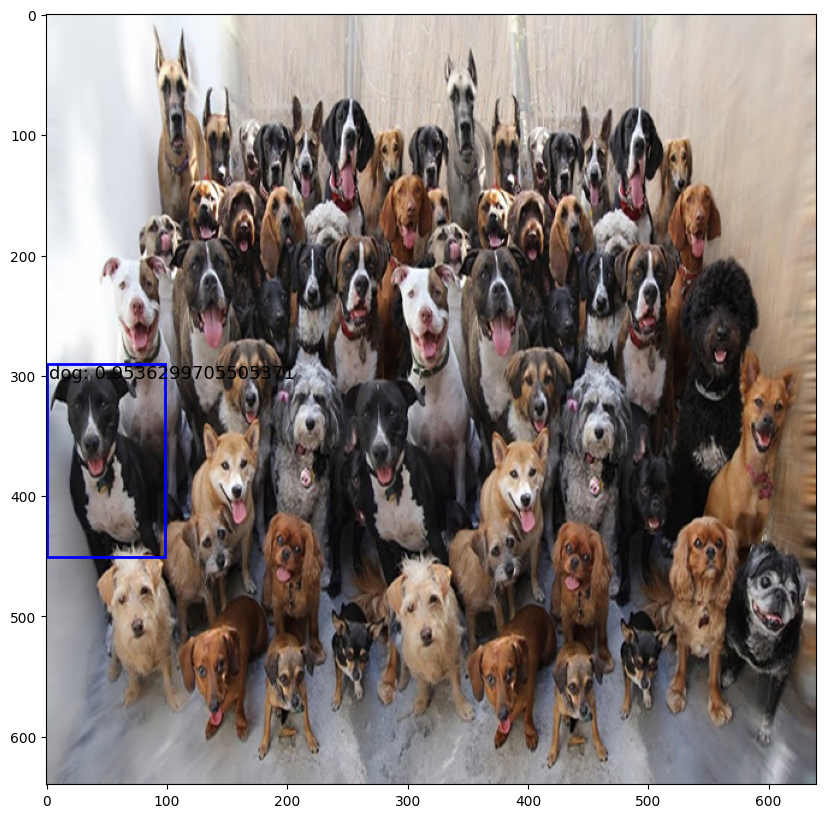

In [ ]:
predict("happy-dogs.jpg", model)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


[{'boxes': tensor([[200.7244,  39.0716, 605.9667, 599.9117],
        [ 51.1366, 278.0266, 237.5908, 596.5566],
        [ 37.3556, 268.6085, 234.9037, 597.7354],
        [204.8266,  54.3921, 616.2883, 606.2910]], device='cuda:0'), 'labels': tensor([2, 1, 2, 1], device='cuda:0'), 'scores': tensor([0.9880, 0.8583, 0.2905, 0.2698], device='cuda:0')}]


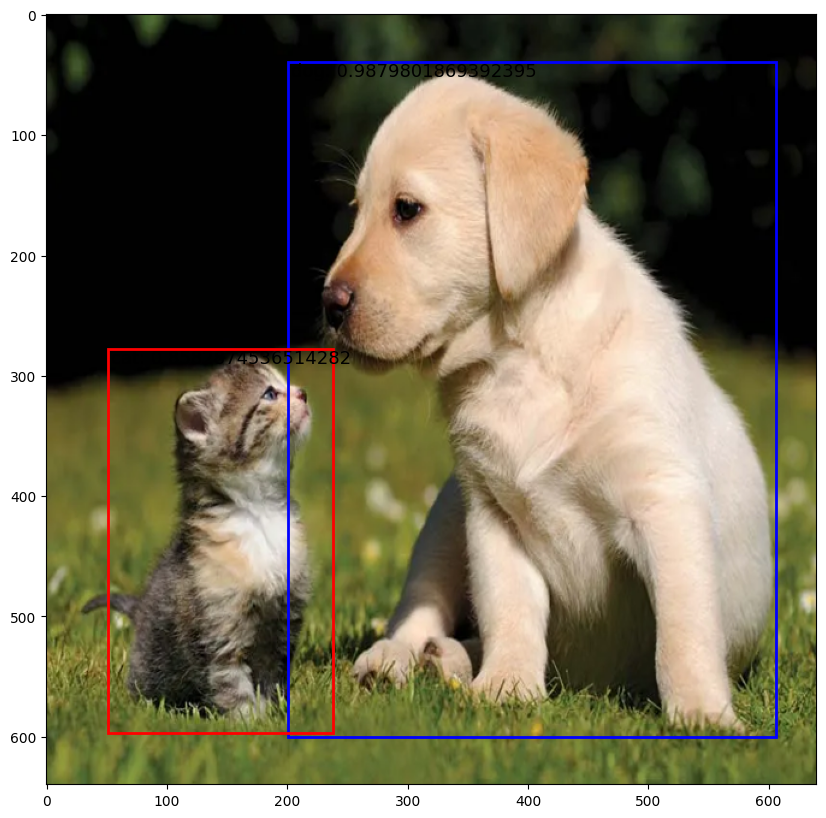

In [27]:
predict("kitten_and_puppy.jpg", model)